# 시바견과 진돗개를 분류해보자!

+사람도 가끔 헷갈리는

# 모듈 로드

In [4]:
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf 
import numpy as np
import os
import tqdm
import random
from sklearn.datasets import load_files

# 데이터 로드

In [5]:
X_dog = list()

for fileName in os.listdir('./shiba'):
    if fileName.startswith('google'):
        X_dog.append(fileName)

In [6]:
len(X_dog)

183

In [7]:
for fileName in os.listdir('./진돗개2'):
    X_dog.append(fileName)

In [8]:
len(X_dog)

373

시바견 : 232 / 진돗개 : 244

In [10]:
n_shiba = 283
n_jindo = 190

# Category 만들기 

시바견이면 [1,0]

진돗개면 [0,1]



In [11]:
shiba_labels = list(list([1,0] for _ in range(n_shiba)))
jindo_labels = list(list([0,1] for _ in range(n_jindo)))

In [12]:
labels = shiba_labels + jindo_labels

In [13]:
labels = np.array(labels).astype('int')

In [14]:
len(labels),labels[:3]

(473, array([[1, 0],
        [1, 0],
        [1, 0]]))

# image_resize

시바견과 진돗개의 폴더 위치가 달라서 각가 resize 후 합쳐준다. 

Color가 아닌 Gray-scale을 이용해서 분석하였다. 

(stanford dog breed classification도 gray-scale이길래..)

In [22]:
resize_dog = list()

for dog in X_dog[:n_shiba]:
    img = cv2.imread('./shiba/' + dog,cv2.IMREAD_GRAYSCALE)
    resize = cv2.resize(img,(224,224))
    resize_dog.append(resize)

error: OpenCV(4.0.0) /Users/travis/build/skvark/opencv-python/opencv/modules/imgproc/src/resize.cpp:3784: error: (-215:Assertion failed) !ssize.empty() in function 'resize'


In [17]:
len(resize_dog)

184

In [18]:
resize_dog[0].shape

(224, 224)

In [20]:
for i in X_dog[n_shiba:]:
    img = cv2.imread('./진돗개2/'+i,cv2.IMREAD_GRAYSCALE)
    resize = cv2.resize(img,(224,224))
    resize_dog.append(resize)

In [21]:
len(resize_dog)

274

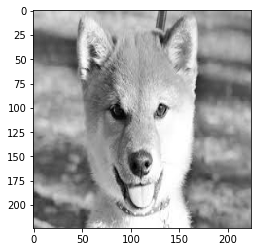

In [38]:
# 잘 됐는지 임의로 하나 출력해보자. 
plt.imshow(resize_dog[2],cmap=plt.cm.gray)
plt.show()

# Train / Test 분할

그전에 먼저 데이터 Shuffle 해주기

In [44]:
# data shuffle

np.random.seed(42)
tmp = [[x,y] for x, y in zip(resize_dog, labels)]
random.shuffle(tmp)
X_sample = [n[0] for n in tmp]
y_sample = [n[1] for n in tmp]

In [45]:
# Train / Test Split
# 80 : 20
train_size = np.ceil(0.8 * len(resize_dog)).astype(int) # 381 / 나머지 95개 test 할당

X_train = X_sample[:train_size]
y_train = y_sample[:train_size]

X_test = X_sample[train_size:]
y_test = y_sample[train_size:]


In [46]:
X_train = np.array(X_train)
y_train = np.array(y_train)

X_test = np.array(X_test)
y_test = np.array(y_test)

In [47]:
len(X_train), len(y_train), len(X_test), len(y_test)

(381, 381, 95, 95)

[1 0]


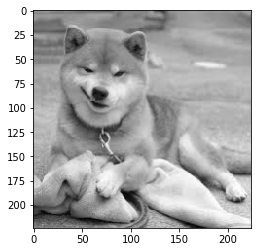

In [48]:
plt.imshow(X_test[1],cmap=plt.cm.gray)
print(y_test[1])
plt.show()

# Network 구축하기

by Keras

In [49]:
IMG_SIZE = 224

In [50]:
# (None,224,224,1) 형태로 reshape
X_train = X_train.reshape(X_train.shape[0],IMG_SIZE,IMG_SIZE,1)
X_test = X_test.reshape(X_test.shape[0],IMG_SIZE,IMG_SIZE,1)

In [51]:
from keras import models
from keras.layers import Conv2D, MaxPooling2D,BatchNormalization,Dropout,Flatten,Dense

Using TensorFlow backend.


In [52]:
IMG_SIZE = 224
def Network(name):
    
    name.add(Conv2D(32, kernel_size = (3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 1)))
    name.add(MaxPooling2D(pool_size=(2,2)))
    name.add(BatchNormalization())
    name.add(Conv2D(64, kernel_size=(3,3), activation='relu'))
    name.add(MaxPooling2D(pool_size=(2,2)))
    name.add(BatchNormalization())
    name.add(Conv2D(64, kernel_size=(3,3), activation='relu'))
    name.add(MaxPooling2D(pool_size=(2,2)))
    name.add(BatchNormalization())
    name.add(Conv2D(96, kernel_size=(3,3), activation='relu'))
    name.add(MaxPooling2D(pool_size=(2,2)))
    name.add(BatchNormalization())
    name.add(Conv2D(32, kernel_size=(3,3), activation='relu'))
    name.add(MaxPooling2D(pool_size=(2,2)))
    name.add(BatchNormalization())
    name.add(Dropout(0.2))
    name.add(Flatten())
    name.add(Dense(128, activation='relu'))
    name.add(Dropout(0.3))
    name.add(Dense(2, activation = 'softmax'))

In [53]:
model1 = models.Sequential()
model2 = models.Sequential()
Network(model1)
Network(model2)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [54]:
model1.compile(optimizer='rmsprop',loss='categorical_crossentropy',metrics=['accuracy'])

In [55]:
model2.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [56]:
X_train.shape

(381, 224, 224, 1)

# RmsProp

In [237]:
model1.fit(np.array(X_train),np.array(y_train),epochs=15,batch_size=20,verbose=1)

Epoch 1/15
381/381 [==============================] - 32s 83ms/step - loss: 1.0687 - acc: 0.5722
Epoch 2/15
381/381 [==============================] - 28s 72ms/step - loss: 0.7263 - acc: 0.6877
Epoch 3/15
381/381 [==============================] - 28s 73ms/step - loss: 0.6903 - acc: 0.7349
Epoch 4/15
381/381 [==============================] - 28s 73ms/step - loss: 0.5124 - acc: 0.7848
Epoch 5/15
381/381 [==============================] - 28s 74ms/step - loss: 0.4785 - acc: 0.7664
Epoch 6/15
381/381 [==============================] - 28s 73ms/step - loss: 0.3344 - acc: 0.8451
Epoch 7/15
381/381 [==============================] - 28s 72ms/step - loss: 0.3802 - acc: 0.8346
Epoch 8/15
381/381 [==============================] - 28s 73ms/step - loss: 0.3330 - acc: 0.8688
Epoch 9/15
381/381 [==============================] - 28s 73ms/step - loss: 0.2578 - acc: 0.8898
Epoch 10/15
381/381 [==============================] - 28s 73ms/step - loss: 0.2201 - acc: 0.9055
Epoch 11/15
381/381 [========

In [239]:
# optimizer : RmsProp / epochs : 15 / batch_size = 20
# network는 동일 
loss, acc = model1.evaluate(X_test,y_test,verbose=0)
print("Accuracy : %0.2f" % (acc*100))

Accuracy : 67.37


In [251]:
model2.fit(np.array(X_train),np.array(y_train),epochs=15,batch_size=20,verbose=1)

Epoch 1/15
381/381 [==============================] - 27s 72ms/step - loss: 0.5673 - acc: 0.7743
Epoch 2/15
381/381 [==============================] - 28s 72ms/step - loss: 0.3224 - acc: 0.8845
Epoch 3/15
381/381 [==============================] - 27s 71ms/step - loss: 0.3590 - acc: 0.8504
Epoch 4/15
381/381 [==============================] - 28s 74ms/step - loss: 0.3302 - acc: 0.8661
Epoch 5/15
381/381 [==============================] - 35s 91ms/step - loss: 0.2623 - acc: 0.8740
Epoch 6/15
381/381 [==============================] - 28s 73ms/step - loss: 0.1526 - acc: 0.9423
Epoch 7/15
381/381 [==============================] - 28s 75ms/step - loss: 0.2321 - acc: 0.9213
Epoch 8/15
381/381 [==============================] - 28s 73ms/step - loss: 0.2306 - acc: 0.9055
Epoch 9/15
381/381 [==============================] - 28s 73ms/step - loss: 0.2819 - acc: 0.8766
Epoch 10/15
381/381 [==============================] - 27s 72ms/step - loss: 0.1660 - acc: 0.9265
Epoch 11/15
381/381 [========

In [252]:
# optimizer : Adam / Dropout = 0.3 추가 / epochs : 15 / batch_size = 20
# network는 동일 
loss, acc = model2.evaluate(X_test,y_test,verbose=0)
print("Accuracy : %0.2f" % (acc*100))

Accuracy : 69.47


Trainin Acc는 계속 높게 나오지만 Test Acc는 Epoch, batch_size등등에 따라 계속 변화하며 낮은 수치를 보인다. 

Training Acc는 높고 Test Acc가 낮다는 것은 이는 Overfitting을 의미한다.

이를 해결하기 위해 다른 방법들을 적용해 볼 것이다. 

# 1. Validation 이용

dataset 자체가 작기 때문에 Validation을 시도하기는 어렵다.


# 2. Optimizer 바꾸기

기존에는 RmsProp를 이용했는데 Adam으로 바꿨을 때,67% -> 69%로 조금 낮아졌다. 

하지만 초기 파라미터가 랜덤하기 때문에 정확도가 무작위성으로 바뀐다. 

In [305]:
model2.fit(np.array(X_train),np.array(y_train),epochs=15,batch_size=20,verbose=1,validation_split=0.1)

Train on 342 samples, validate on 39 samples
Epoch 1/15
342/342 [==============================] - 36s 106ms/step - loss: 1.0194 - acc: 0.6023 - val_loss: 1.1626 - val_acc: 0.5897
Epoch 2/15
342/342 [==============================] - 35s 104ms/step - loss: 0.6595 - acc: 0.6959 - val_loss: 1.2722 - val_acc: 0.4872
Epoch 3/15
342/342 [==============================] - 38s 111ms/step - loss: 0.5092 - acc: 0.7661 - val_loss: 0.8841 - val_acc: 0.7179
Epoch 4/15
342/342 [==============================] - 35s 103ms/step - loss: 0.3492 - acc: 0.8304 - val_loss: 0.9681 - val_acc: 0.6154
Epoch 5/15
342/342 [==============================] - 35s 102ms/step - loss: 0.3792 - acc: 0.8538 - val_loss: 1.2840 - val_acc: 0.5128
Epoch 6/15
342/342 [==============================] - 38s 112ms/step - loss: 0.2903 - acc: 0.8772 - val_loss: 0.8751 - val_acc: 0.6154
Epoch 7/15
342/342 [==============================] - 35s 101ms/step - loss: 0.2455 - acc: 0.9123 - val_loss: 0.7071 - val_acc: 0.7436
Epoch 8/15

In [306]:
# optimizer : Adam / Dropout = 0.3 추가 / epochs : 15 / batch_size = 20
# Validation 추가 
loss, acc = model2.evaluate(X_test,y_test,verbose=0)
print("Accuracy : %0.2f" % (acc*100))

Accuracy : 70.53


# Epoch 늘리기

In [307]:
model2.fit(np.array(X_train),np.array(y_train),epochs=30,batch_size=20,verbose=1,validation_split=0.1)

Train on 342 samples, validate on 39 samples
Epoch 1/30
342/342 [==============================] - 31s 92ms/step - loss: 0.1395 - acc: 0.9591 - val_loss: 1.2031 - val_acc: 0.6154
Epoch 2/30
342/342 [==============================] - 31s 90ms/step - loss: 0.0693 - acc: 0.9708 - val_loss: 1.0359 - val_acc: 0.6923
Epoch 3/30
342/342 [==============================] - 30s 88ms/step - loss: 0.0739 - acc: 0.9737 - val_loss: 4.0959 - val_acc: 0.4615
Epoch 4/30
342/342 [==============================] - 29s 84ms/step - loss: 0.0737 - acc: 0.9766 - val_loss: 1.6908 - val_acc: 0.5385
Epoch 5/30
342/342 [==============================] - 31s 91ms/step - loss: 0.0370 - acc: 0.9883 - val_loss: 0.7877 - val_acc: 0.6410
Epoch 6/30
342/342 [==============================] - 31s 91ms/step - loss: 0.0274 - acc: 0.9912 - val_loss: 1.0398 - val_acc: 0.6154
Epoch 7/30
342/342 [==============================] - 30s 87ms/step - loss: 0.0151 - acc: 1.0000 - val_loss: 1.1282 - val_acc: 0.7179
Epoch 8/30
342/34

In [308]:
# optimizer : Adam / Dropout = 0.3 추가 / epochs : 30 / batch_size = 20
loss, acc = model2.evaluate(X_test,y_test,verbose=0)
print("Accuracy : %0.2f" % (acc*100))

Accuracy : 73.68


Epoch를 늘렸더니 성능이 조금 나아지긴 한다. Epoch를 100이상 주고싶지만 지금의 환경에서는 더 성능이 나올 것 같지는 않아서 Data Augmentation을 거치고 다시 학습해볼 것이다. 데이터 수가 많아지면 Validation에도 데이터를 더 부여해서 학습하는 과정을 가질 것이다. 

# Data Augmentation

Augmentation에는 다양한 방법이 존재한다. Flip_vertical / flip_horizontal / rotate / crop / translation, contrast, bright, inverse등이 있다. 

추후에 labeling이 어려우니 시바견 따로, 진돗개 따로 Augmentation을 할 것이다. 

In [69]:
shiba_dog = list()

for fileName in os.listdir('./shiba'):
    if fileName.startswith('google'):
        shiba_dog.append(fileName)
        
shiba_img = list()

for dog in shiba_dog:
    img = cv2.imread('./shiba/' + dog,cv2.IMREAD_GRAYSCALE)
    resize = cv2.resize(img,(224,224))
    shiba_img.append(resize)
    
shiba_img = np.array(shiba_img)
shiba_labels = list(list([1,0] for _ in range(n_shiba)))


In [70]:
len(shiba_dog), len(shiba_img)

(232, 232)

In [71]:
jindot_dog = list()
for fileName in os.listdir('./진돗개'):
    jindot_dog.append(fileName)

jindot_img = list()

for dog in jindot_dog:
    img = cv2.imread('./진돗개/' + dog,cv2.IMREAD_GRAYSCALE)
    resize = cv2.resize(img,(224,224))
    jindot_img.append(resize)
    
jindot_img = np.array(jindot_img)
jindo_labels = list(list([0,1] for _ in range(n_jindo)))

In [72]:
len(jindot_dog), len(jindot_img)

(244, 244)

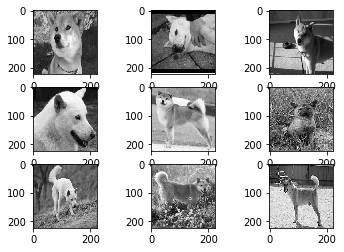

In [57]:
import matplotlib.pyplot as plt
for i in range(0,9):
    plt.subplot(330 + 1 + i)
    plt.imshow(X_train[i].reshape(224,224),cmap=plt.cm.gray)
plt.show()

먼저 기존의 학습데이터 시바견과 진돗개들 출력했습니다.

# 1. Feature Standardization

이미지의 픽셀을 전체 데이터셋에 대해 표준화하는 것이다.

In [66]:
from keras.preprocessing.image import ImageDataGenerator
from keras import backend as K
K.set_image_dim_ordering('th')

### 시바견

/Users/charming/anaconda3/lib/python3.7/site-packages/matplotlib/text.py:1191: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


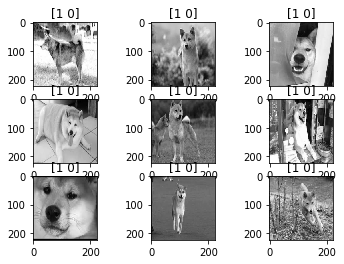

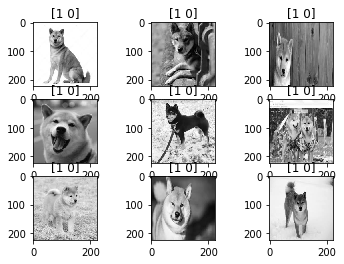

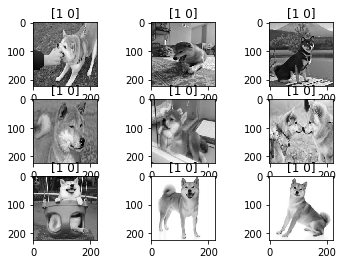

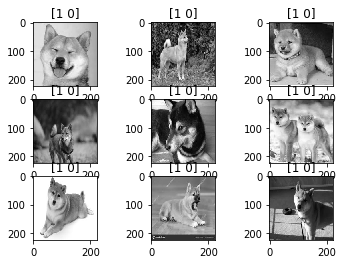

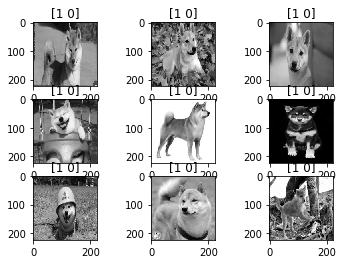

...

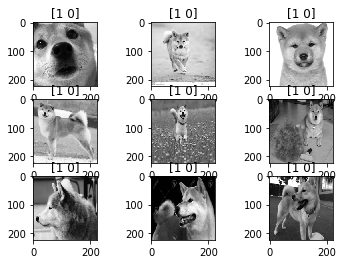

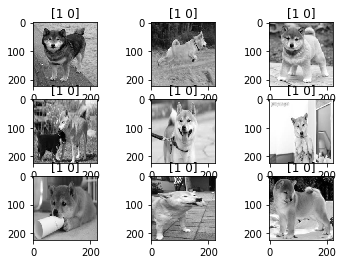

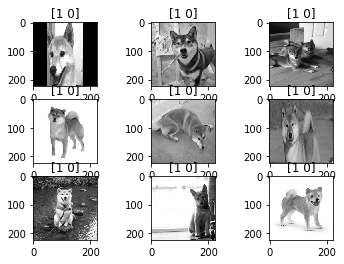

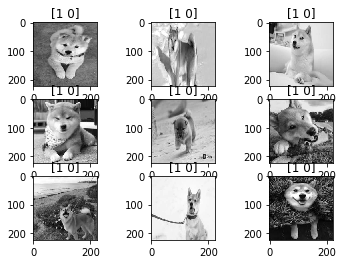

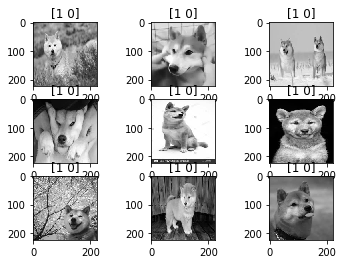

IndexError: index 7 is out of bounds for axis 0 with size 7

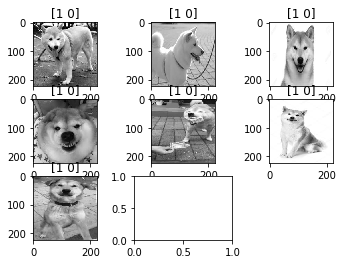

In [73]:
X_train_FS =shiba_img.reshape(shiba_img.shape[0],1,224,224)

X_train_FS = X_train_FS.astype('float32')

datagen = ImageDataGenerator(featurewise_center=True, featurewise_std_normalization=True)
datagen.fit(X_train_FS)

# datagen.flow(X_train_FS,y_train,batch_size=9)
for X_batch,y_batch in datagen.flow(X_train_FS,shiba_labels,batch_size=9,save_to_dir='shiba',save_prefix='aug',save_format="jpeg"):
    for i in range(0,9):
        plt.subplot(330+1+i)
        plt.title(y_batch[i])
        plt.imshow(X_batch[i].reshape(224,224),cmap=plt.cm.gray)
        
    plt.show()

### 진돗개

/Users/charming/anaconda3/lib/python3.7/site-packages/matplotlib/text.py:1191: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


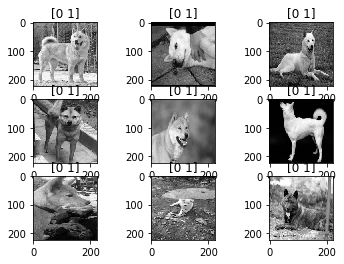

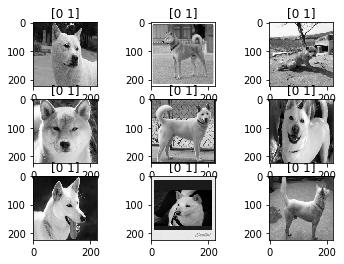

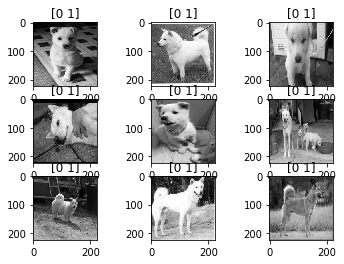

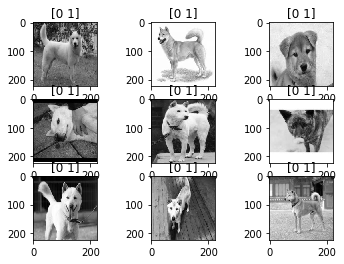

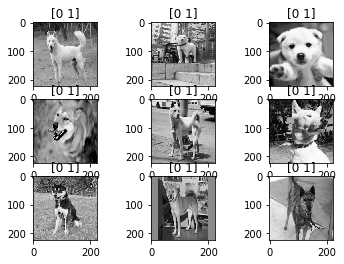

...

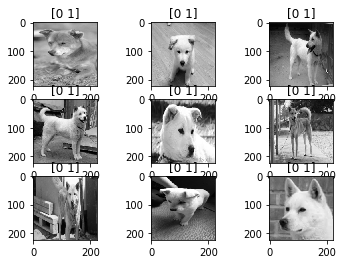

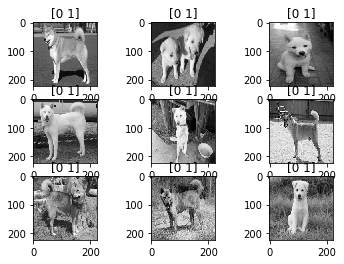

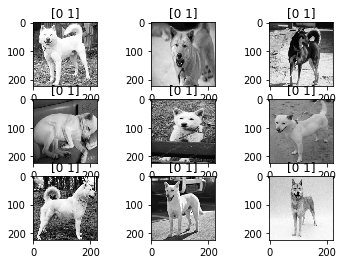

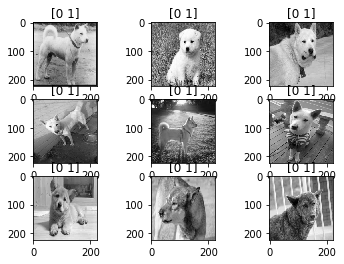

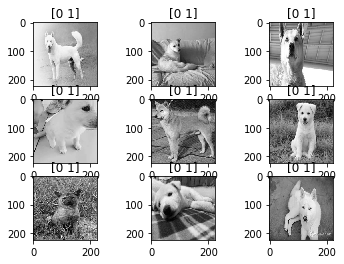

IndexError: index 1 is out of bounds for axis 0 with size 1

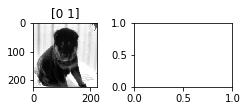

In [74]:
X_train_FS =jindot_img.reshape(jindot_img.shape[0],1,224,224)

X_train_FS = X_train_FS.astype('float32')

datagen = ImageDataGenerator(featurewise_center=True, featurewise_std_normalization=True)
datagen.fit(X_train_FS)

# datagen.flow(X_train_FS,y_train,batch_size=9)
for X_batch,y_batch in datagen.flow(X_train_FS,jindo_labels,batch_size=9,save_to_dir='진돗개',save_prefix='aug',save_format="jpeg"):
    for i in range(0,9):
        plt.subplot(330+1+i)
        plt.title(y_batch[i])
        plt.imshow(X_batch[i].reshape(224,224),cmap=plt.cm.gray)
        
    plt.show()

# 2. Random Rotations

### 시바견

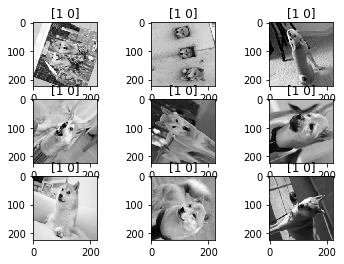

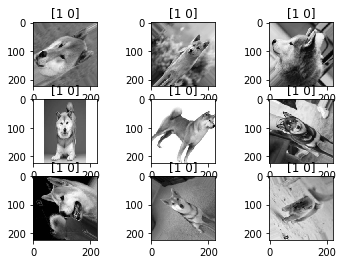

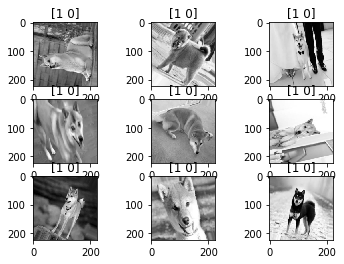

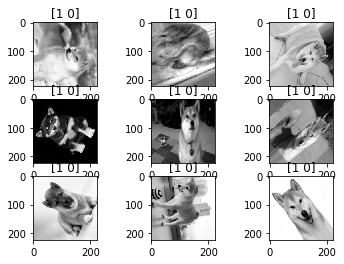

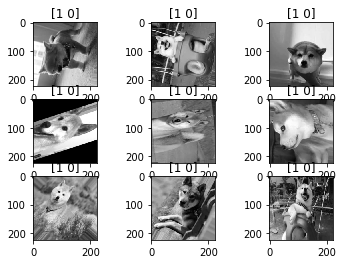

...

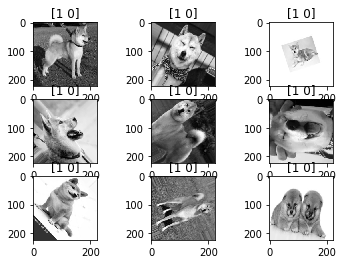

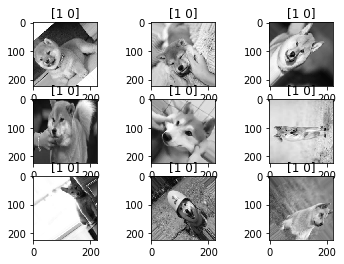

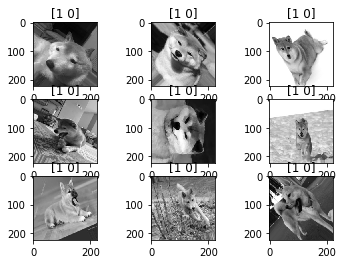

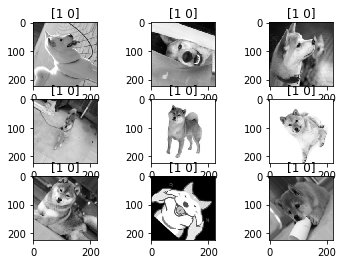

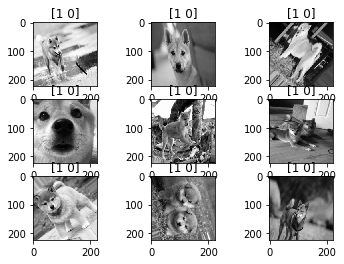

IndexError: index 7 is out of bounds for axis 0 with size 7

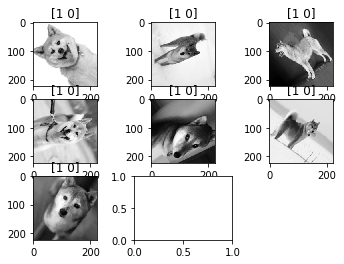

In [75]:
X_train_S =shiba_img.reshape(shiba_img.shape[0],1,224,224)

X_train_S = X_train_S.astype('float32')

datagen = ImageDataGenerator(rotation_range=90)
datagen.fit(X_train_S)

for X_batch,y_batch in datagen.flow(X_train_S,shiba_labels,batch_size=9,save_to_dir='shiba',save_prefix='aug',save_format="jpeg"):
    for i in range(0,9):
        plt.subplot(330+1+i)
        plt.title(y_batch[i])
        plt.imshow(X_batch[i].reshape(224,224),cmap=plt.cm.gray)
        
    plt.show()

### 진돗개

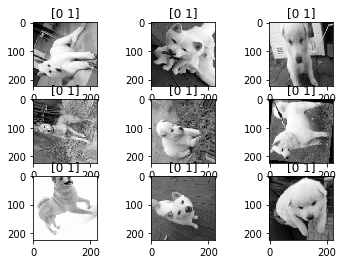

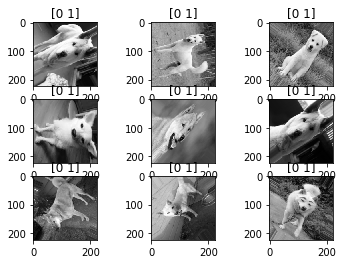

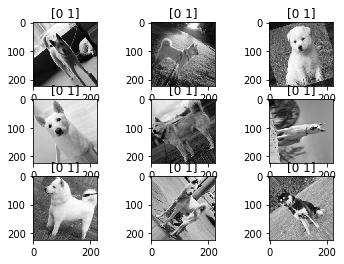

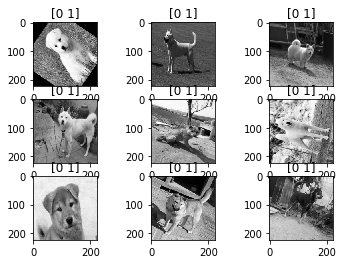

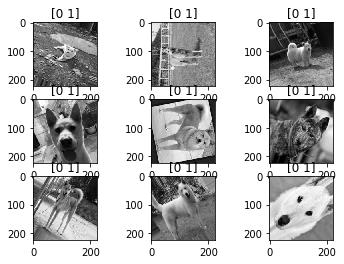

...

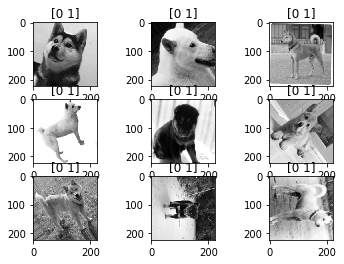

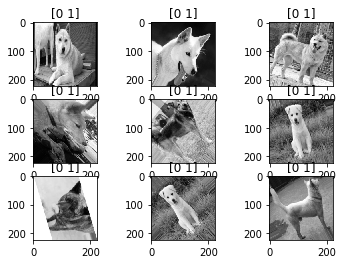

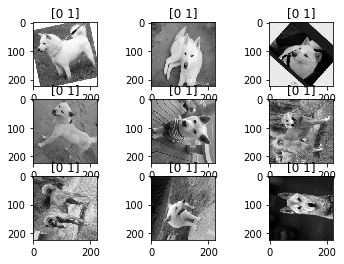

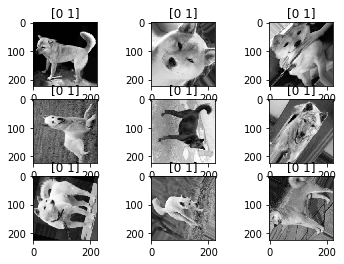

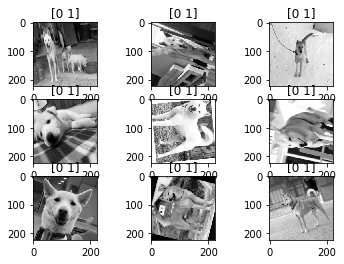

IndexError: index 1 is out of bounds for axis 0 with size 1

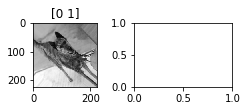

In [76]:
X_train_F =jindot_img.reshape(jindot_img.shape[0],1,224,224)

X_train_F = X_train_F.astype('float32')

datagen = ImageDataGenerator(rotation_range=90)
datagen.fit(X_train_F)

# datagen.flow(X_train_FS,y_train,batch_size=9)
for X_batch,y_batch in datagen.flow(X_train_F,jindo_labels,batch_size=9,save_to_dir='진돗개',save_prefix='aug',save_format="jpeg"):
    for i in range(0,9):
        plt.subplot(330+1+i)
        plt.title(y_batch[i])
        plt.imshow(X_batch[i].reshape(224,224),cmap=plt.cm.gray)
        
    plt.show()

# 3. Random Shifts

### Shiba

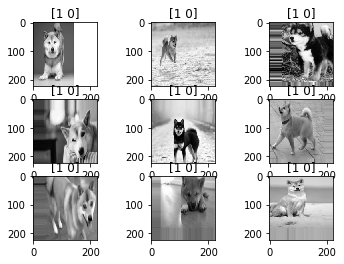

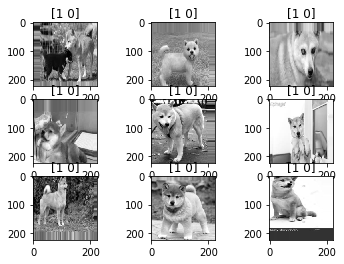

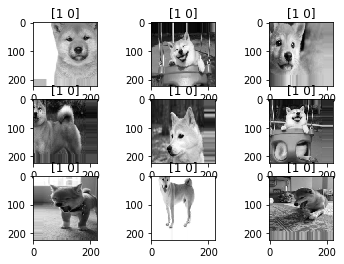

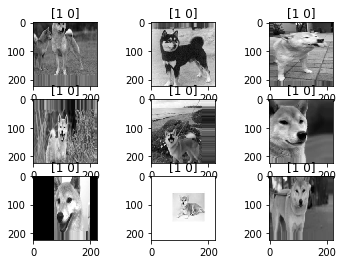

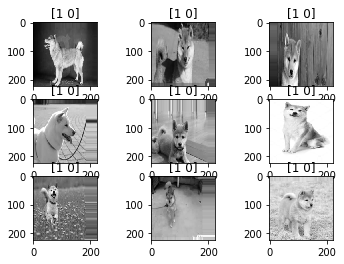

...

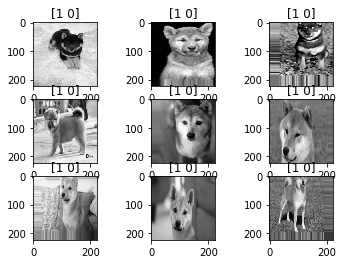

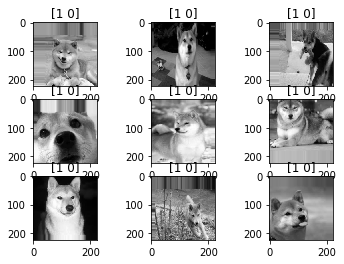

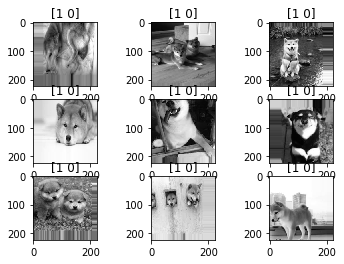

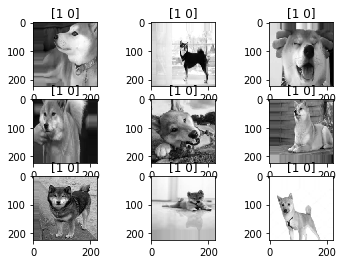

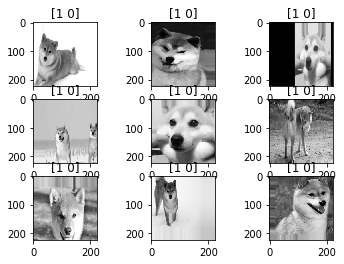

IndexError: index 7 is out of bounds for axis 0 with size 7

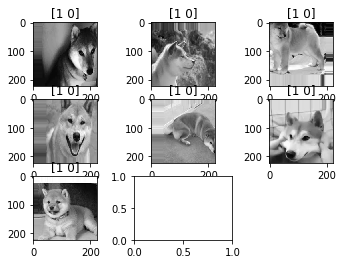

In [77]:
X_train_S =shiba_img.reshape(shiba_img.shape[0],1,224,224)

X_train_S = X_train_S.astype('float32')

shift = 0.2
datagen = ImageDataGenerator(width_shift_range=shift, height_shift_range=shift)
datagen.fit(X_train_S)

for X_batch,y_batch in datagen.flow(X_train_S,shiba_labels,batch_size=9,save_to_dir='shiba',save_prefix='aug',save_format="jpeg"):
    for i in range(0,9):
        plt.subplot(330+1+i)
        plt.title(y_batch[i])
        plt.imshow(X_batch[i].reshape(224,224),cmap=plt.cm.gray)
        
    plt.show()

### 진돗개

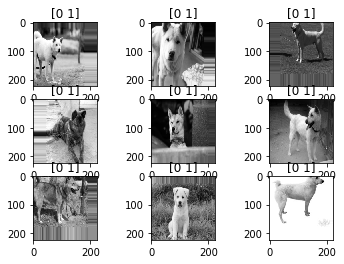

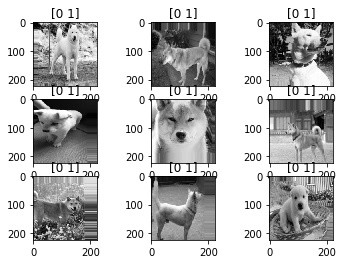

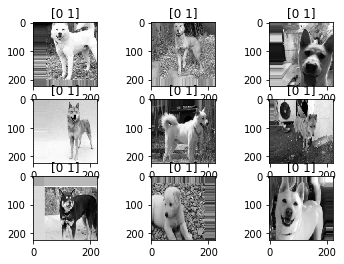

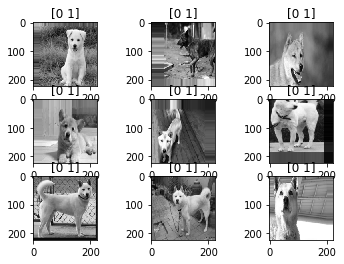

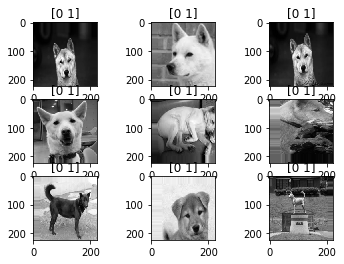

...

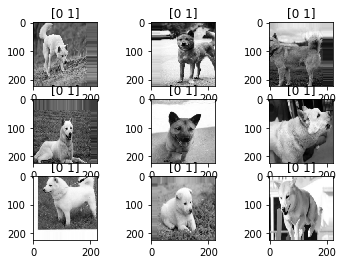

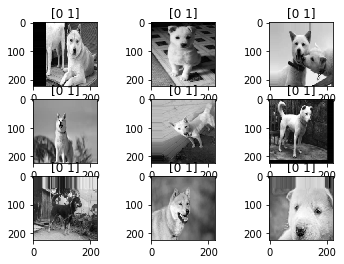

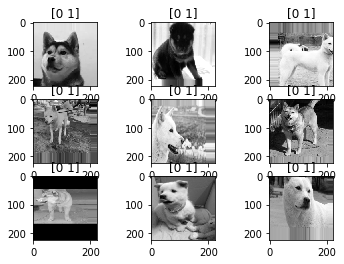

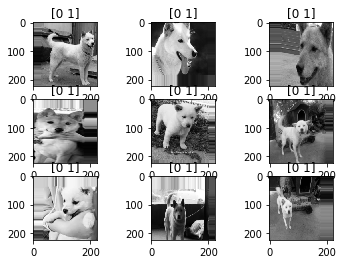

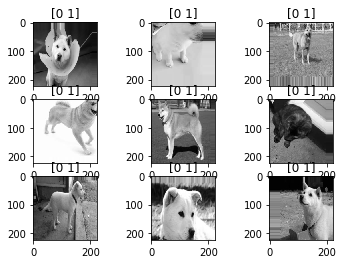

IndexError: index 1 is out of bounds for axis 0 with size 1

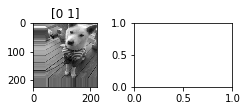

In [78]:
X_train_F =jindot_img.reshape(jindot_img.shape[0],1,224,224)

X_train_F = X_train_F.astype('float32')

shift = 0.2
datagen = ImageDataGenerator(width_shift_range=shift, height_shift_range=shift)
datagen.fit(X_train_F)

# datagen.flow(X_train_FS,y_train,batch_size=9)
for X_batch,y_batch in datagen.flow(X_train_F,jindo_labels,batch_size=9,save_to_dir='진돗개',save_prefix='aug',save_format="jpeg"):
    for i in range(0,9):
        plt.subplot(330+1+i)
        plt.title(y_batch[i])
        plt.imshow(X_batch[i].reshape(224,224),cmap=plt.cm.gray)
        
    plt.show()

# 4. Random Flips

### 시바견

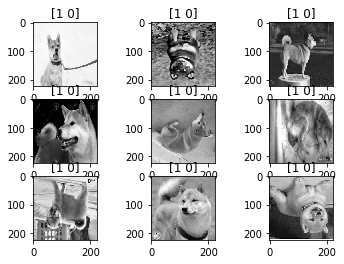

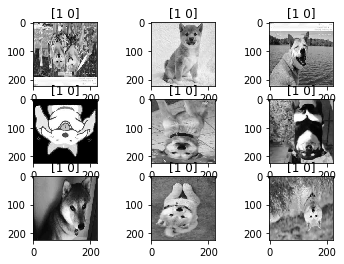

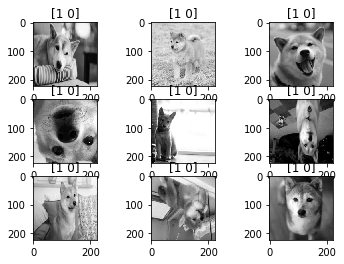

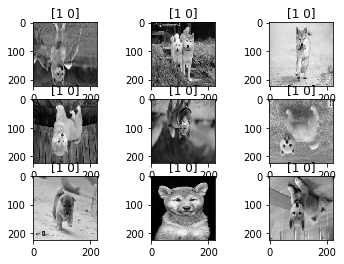

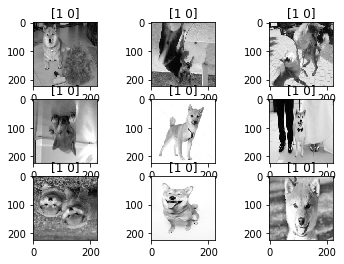

...

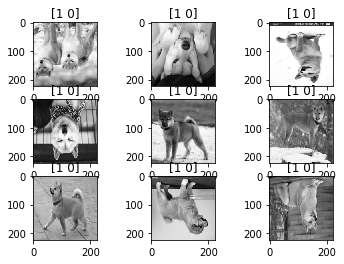

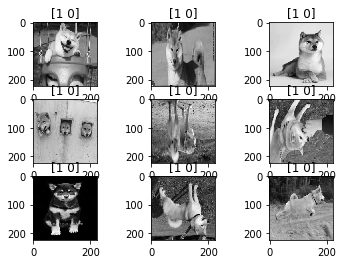

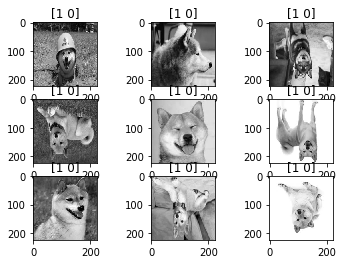

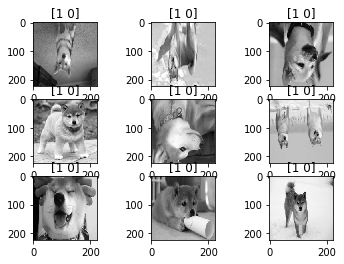

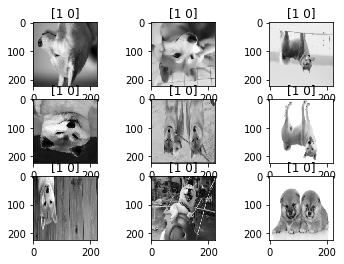

IndexError: index 7 is out of bounds for axis 0 with size 7

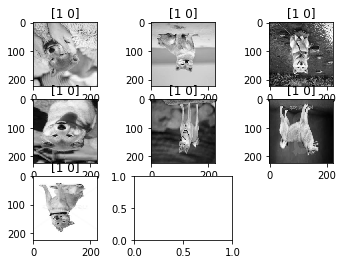

In [79]:
X_train_S =shiba_img.reshape(shiba_img.shape[0],1,224,224)

X_train_S = X_train_S.astype('float32')

datagen = ImageDataGenerator(horizontal_flip=True,vertical_flip=True)
datagen.fit(X_train_S)

for X_batch,y_batch in datagen.flow(X_train_S,shiba_labels,batch_size=9,save_to_dir='shiba',save_prefix='aug',save_format="jpeg"):
    for i in range(0,9):
        plt.subplot(330+1+i)
        plt.title(y_batch[i])
        plt.imshow(X_batch[i].reshape(224,224),cmap=plt.cm.gray)
        
    plt.show()

### 진돗개

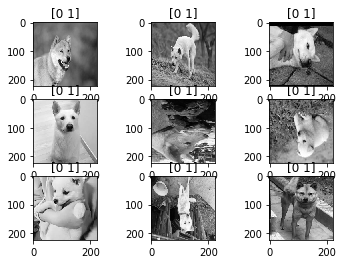

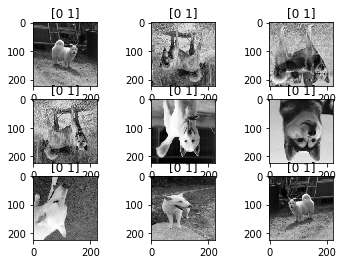

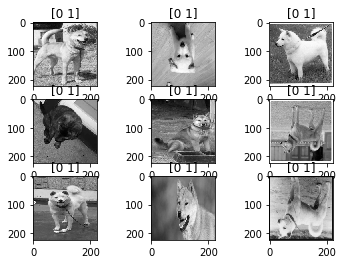

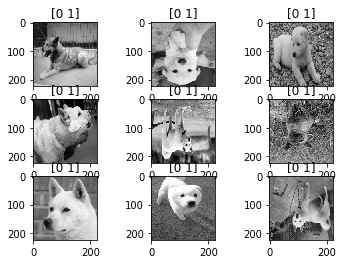

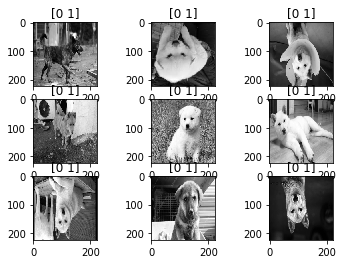

...

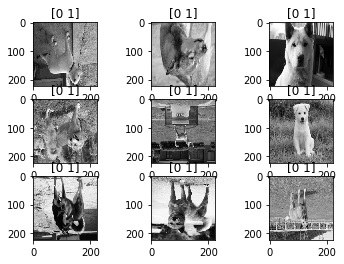

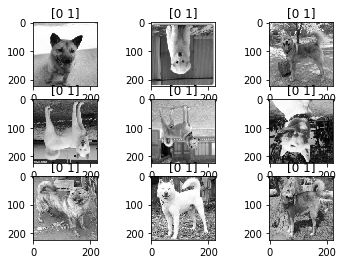

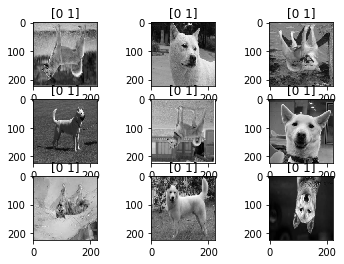

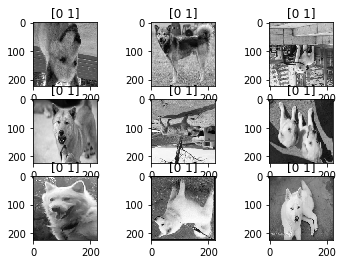

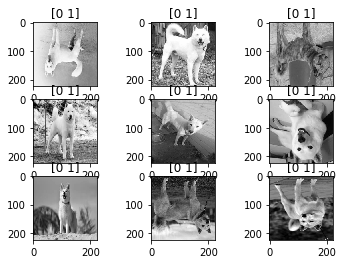

IndexError: index 1 is out of bounds for axis 0 with size 1

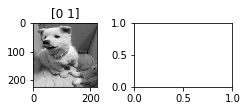

In [80]:
X_train_F =jindot_img.reshape(jindot_img.shape[0],1,224,224)

X_train_F = X_train_F.astype('float32')

datagen = ImageDataGenerator(horizontal_flip=True,vertical_flip=True)
datagen.fit(X_train_F)

# datagen.flow(X_train_FS,y_train,batch_size=9)
for X_batch,y_batch in datagen.flow(X_train_F,jindo_labels,batch_size=9,save_to_dir='진돗개',save_prefix='aug',save_format="jpeg"):
    for i in range(0,9):
        plt.subplot(330+1+i)
        plt.title(y_batch[i])
        plt.imshow(X_batch[i].reshape(224,224),cmap=plt.cm.gray)
        
    plt.show()

Data Augmentation 이후의 학습과정과 평가 과정은 2부에서...